In [1]:
# Install pycocotools
!pip install pycocotools

# Download and extract COCO dataset
!mkdir coco_dataset
%cd coco_dataset
!mkdir images annotations

# Download train and validation images
!wget http://images.cocodataset.org/zips/train2017.zip
!wget http://images.cocodataset.org/zips/val2017.zip

# Extract images
!unzip train2017.zip -d images
!unzip val2017.zip -d images


# Download annotations
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip

# Extract annotations
!unzip annotations_trainval2017.zip -d annotations

# Navigate back to the root directory
%cd /content


Streaming output truncated to the last 5000 lines.
 extracting: images/val2017/000000346905.jpg  
 extracting: images/val2017/000000433980.jpg  
 extracting: images/val2017/000000228144.jpg  
 extracting: images/val2017/000000041872.jpg  
 extracting: images/val2017/000000117492.jpg  
 extracting: images/val2017/000000368900.jpg  
 extracting: images/val2017/000000376900.jpg  
 extracting: images/val2017/000000352491.jpg  
 extracting: images/val2017/000000330790.jpg  
 extracting: images/val2017/000000384850.jpg  
 extracting: images/val2017/000000032735.jpg  
 extracting: images/val2017/000000197004.jpg  
 extracting: images/val2017/000000526751.jpg  
 extracting: images/val2017/000000041488.jpg  
 extracting: images/val2017/000000153632.jpg  
 extracting: images/val2017/000000501523.jpg  
 extracting: images/val2017/000000405691.jpg  
 extracting: images/val2017/000000040757.jpg  
 extracting: images/val2017/000000219485.jpg  
 extracting: images/val2017/000000428280.jpg  
 extracti

In [2]:
# Now let's load the COCO dataset
from torchvision.datasets import CocoDetection
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

# Define transformations for preprocessing
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load COCO dataset
coco_train = CocoDetection(root='/content/coco_dataset/images/train2017', annFile='/content/coco_dataset/annotations/annotations/instances_train2017.json', transform=transform)
coco_val = CocoDetection(root='/content/coco_dataset/images/val2017', annFile='/content/coco_dataset/annotations/annotations/instances_val2017.json', transform=transform)

# Create DataLoader
batch_size = 8
train_loader = DataLoader(coco_train, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(coco_val, batch_size=batch_size, shuffle=False)





loading annotations into memory...
Done (t=19.47s)
creating index...
index created!
loading annotations into memory...
Done (t=2.58s)
creating index...
index created!


In [3]:
import os
import torch
import torchvision
from torchvision import transforms, datasets

# Define the dataset directory
data_dir = '/content/coco_dataset'

# Download and prepare the dataset
dataset = datasets.CocoDetection(root=data_dir, annFile=os.path.join(data_dir, '/content/coco_dataset/annotations/annotations/instances_train2017.json'),
                                 transform=transforms.ToTensor())

# Data loader
data_loader = torch.utils.data.DataLoader(dataset, batch_size=4, shuffle=True, num_workers=4)


loading annotations into memory...
Done (t=16.02s)
creating index...
index created!


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
import torchvision.models.detection as detection

# Load pre-trained Faster R-CNN model
model_faster_rcnn = detection.fasterrcnn_resnet50_fpn(pretrained=True)
model_faster_rcnn.eval()

# Move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_faster_rcnn.to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 135MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # Clone YOLOv5 repository
%cd yolov5
%pip install -qr requirements.txt  # Install dependencies

import torch

# Load pre-trained YOLOv5 model
model_yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s')
model_yolo.eval()
model_yolo.to(device)


Cloning into 'yolov5'...
remote: Enumerating objects: 16625, done.
remote: Counting objects: 100% (103/103), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 16625 (delta 58), reused 66 (delta 30), pack-reused 16522
Receiving objects: 100% (16625/16625), 15.15 MiB | 20.68 MiB/s, done.
Resolving deltas: 100% (11411/11411), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 777.9/777.9 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 26.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the follow

/usr/local/lib/python3.10/dist-packages/torch/hub.py:293: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2024-5-25 Python-3.10.12 torch-2.3.0+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 129MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

In [ ]:
model_ssd = detection.ssd300_vgg16(pretrained=True)
model_ssd.eval()
model_ssd.to(device)


Downloading: "https://download.pytorch.org/models/ssd300_vgg16_coco-b556d3b4.pth" to /root/.cache/torch/hub/checkpoints/ssd300_vgg16_coco-b556d3b4.pth
100%|██████████| 136M/136M [00:03<00:00, 46.0MB/s]


SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [ ]:
model_retinanet = detection.retinanet_resnet50_fpn(pretrained=True)
model_retinanet.eval()
model_retinanet.to(device)


Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eeacb38b.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_coco-eeacb38b.pth
100%|██████████| 130M/130M [00:01<00:00, 120MB/s]


RetinaNet(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256, eps=0.0)


In [ ]:
import os

# Define the base directory for the dataset
base_dir = '/content/coco_dataset'

# Define subdirectories for images and annotations
dirs = ['train', 'val', 'test']

for d in dirs:
    os.makedirs(os.path.join(base_dir, 'images', d), exist_ok=True)
    os.makedirs(os.path.join(base_dir, 'annotations', d), exist_ok=True)


In [ ]:
import os
import json
from sklearn.model_selection import train_test_split
import shutil

# Define the base directory for the dataset
base_dir = '/content/coco_dataset'

# Define subdirectories for images and annotations
dirs = ['train', 'val', 'test']

for d in dirs:
    os.makedirs(os.path.join(base_dir, 'images', d), exist_ok=True)
    os.makedirs(os.path.join(base_dir, 'annotations', d), exist_ok=True)

# Define paths to the original COCO annotations
coco_annotations_path = os.path.join(base_dir, '/content/coco_dataset/annotations/annotations/instances_train2017.json')

# Load COCO annotations
with open(coco_annotations_path) as f:
    coco_data = json.load(f)

# Get image filenames and corresponding annotation IDs
image_ids = [img['id'] for img in coco_data['images']]
images_info = {img['id']: img for img in coco_data['images']}
annotations_info = {ann['image_id']: [] for ann in coco_data['annotations']}

for ann in coco_data['annotations']:
    annotations_info[ann['image_id']].append(ann)

# Split the dataset
train_ids, test_ids = train_test_split(image_ids, test_size=0.2, random_state=42)
train_ids, val_ids = train_test_split(train_ids, test_size=0.1, random_state=42)

# Helper function to save images and annotations
def save_split(ids, split_name):
    images_dir = os.path.join(base_dir, 'images', split_name)
    annotations_dir = os.path.join(base_dir, 'annotations', split_name)

    # Create COCO format annotation file
    split_annotations = {
        'images': [images_info[i] for i in ids],
        'annotations': [ann for i in ids if i in annotations_info for ann in annotations_info[i]],
        'categories': coco_data['categories']
    }

    with open(os.path.join(annotations_dir, f'instances_{split_name}.json'), 'w') as f:
        json.dump(split_annotations, f)

    # Copy images to the split directory
    for i in ids:
        img_info = images_info[i]
        img_filename = img_info['file_name']
        src_path = os.path.join(base_dir, 'images', 'train2017', img_filename)
        dst_path = os.path.join(images_dir, img_filename)
        if os.path.exists(src_path):  # Check if the image file exists before copying
            shutil.copy(src_path, dst_path)

# Save the training, validation, and test splits
save_split(train_ids, 'train')
save_split(val_ids, 'val')
save_split(test_ids, 'test')


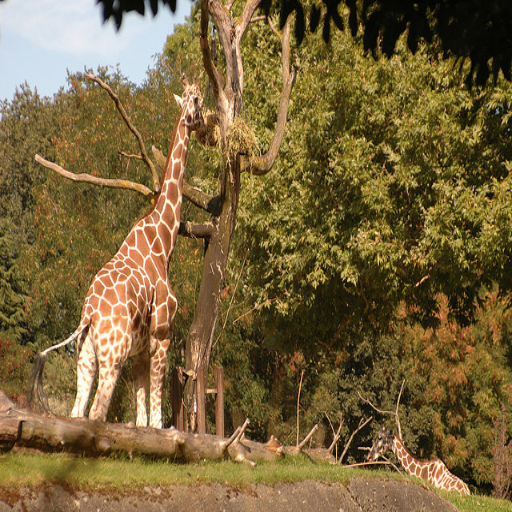

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Define augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Rotate(limit=15, p=0.5),
    A.Resize(512, 512),
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['class_labels']))

# Example of applying transformations
def augment_image(image, bboxes, class_labels):
    transformed = transform(image=image, bboxes=bboxes, class_labels=class_labels)
    return transformed['image'], transformed['bboxes'], transformed['class_labels']


image = cv2.imread('/content/coco_dataset/images/test/000000000025.jpg')
bboxes = [[50, 30, 200, 150], [120, 80, 250, 180]]  # Example bounding boxes
class_labels = [1, 2]  # Example class labels

augmented_image, augmented_bboxes, augmented_class_labels = augment_image(image, bboxes, class_labels)

# Convert tensor to numpy array for visualization
augmented_image_np = augmented_image.permute(1, 2, 0).cpu().numpy()

# Display the augmented image using cv2_imshow
cv2_imshow(augmented_image_np)


In [ ]:
!pip install torch torchvision torchaudio
!pip install tensorflow
!pip install opencv-python
!pip install albumentations


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 13.0 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: pillow 10.3.0
    Uninstalling pillow-10.3.0:
      Successfully uninstalled pillow-10.3.0


##b. Implementing Faster R-CNN Using PyTorch:

In [ ]:
import torch
import torchvision.models.detection as detection

# Load pre-trained Faster R-CNN model
model_faster_rcnn = detection.fasterrcnn_resnet50_fpn(pretrained=True)
model_faster_rcnn.eval()

# Move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_faster_rcnn.to(device)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
import cv2
import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision import transforms as T

# Load a pre-trained model on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Define the preprocessing transform
transform = T.Compose([
    T.ToPILImage(),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


image_path = '/content/coco_dataset/images/test/000000000042.jpg'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_tensor = transform(image_rgb).unsqueeze(0)

# Perform inference
with torch.no_grad():
    output = model(image_tensor)

print(output)


[{'boxes': tensor([[369.7401, 155.8985, 406.9543, 178.8099],
        [323.8505,  70.2123, 395.2339, 137.4832],
        [615.9907, 316.5748, 640.0000, 384.4639],
        [334.4050,  92.2400, 383.2242, 137.3689],
        [322.6005, 203.5712, 640.0000, 470.5363],
        [  3.9175,   1.8820, 367.3270, 209.0424],
        [ 89.1148, 311.7381, 208.1997, 458.5443],
        [364.4731, 180.4040, 397.7112, 213.5361]]), 'labels': tensor([ 3,  3, 10,  3,  3,  3, 70,  3]), 'scores': tensor([0.4187, 0.1851, 0.1405, 0.1139, 0.0724, 0.0609, 0.0555, 0.0545])}]


## Implementing YOLO (v5-v9) Using YOLOv5:

In [ ]:
# Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt  # Install dependencies

import torch

# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load pre-trained YOLOv5 model
model_yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s')
model_yolo.eval()
model_yolo.to(device)


fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.3.0 which is incompatible.


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-5-25 Python-3.10.12 torch-2.3.0+cu121 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

In [ ]:
# Clone the YOLOv5 repository and install requirements
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

# Training YOLOv5
!python train.py --img 640 --batch 16 --epochs 50 --data coco.yaml --weights yolov5s.pt

# Inference
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source path_to_image_or_video


Streaming output truncated to the last 5000 lines.
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000026686.jpg: ignoring corrupt image/label: [Errno 2] No such file or directory: '/content/yolov5/datasets/coco/images/train2017/000000026686.jpg'
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000026697.jpg: ignoring corrupt image/label: [Errno 2] No such file or directory: '/content/yolov5/datasets/coco/images/train2017/000000026697.jpg'
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000026699.jpg: ignoring corrupt image/label: [Errno 2] No such file or directory: '/content/yolov5/datasets/coco/images/train2017/000000026699.jpg'
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000026702.jpg: ignoring corrupt image/label: [Errno 2] No such file or directory: '/content/yolov5/datasets/coco/images/train2017/000000026702.jpg'
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000026713.jpg: ig

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



t/yolov5/datasets/coco/images/train2017/000000515540.jpg'
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000515550.jpg: ignoring corrupt image/label: [Errno 2] No such file or directory: '/content/yolov5/datasets/coco/images/train2017/000000515550.jpg'
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000515555.jpg: ignoring corrupt image/label: [Errno 2] No such file or directory: '/content/yolov5/datasets/coco/images/train2017/000000515555.jpg'
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000515561.jpg: ignoring corrupt image/label: [Errno 2] No such file or directory: '/content/yolov5/datasets/coco/images/train2017/000000515561.jpg'
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000515565.jpg: ignoring corrupt image/label: [Errno 2] No such file or directory: '/content/yolov5/datasets/coco/images/train2017/000000515565.jpg'
train: WARNING ⚠️ /content/yolov5/datasets/coco/images/train2017/000000515566.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



train: New cache created: /content/yolov5/datasets/coco/train2017.cache
Traceback (most recent call last):
  File "/content/yolov5/yolov5/train.py", line 848, in <module>
    main(opt)
  File "/content/yolov5/yolov5/train.py", line 623, in main
    train(opt.hyp, opt, device, callbacks)
  File "/content/yolov5/yolov5/train.py", line 254, in train
    train_loader, dataset = create_dataloader(
  File "/content/yolov5/yolov5/utils/dataloaders.py", line 181, in create_dataloader
    dataset = LoadImagesAndLabels(
  File "/content/yolov5/yolov5/utils/dataloaders.py", line 604, in __init__
    assert nf > 0 or not augment, f"{prefix}No labels found in {cache_path}, can not start training. {HELP_URL}"
AssertionError: train: No labels found in /content/yolov5/datasets/coco/train2017.cache, can not start training. See https://docs.ultralytics.com/yolov5/tutorials/train_custom_data
detect: weights=['yolov5s.pt'], source=path_to_image_or_video, data=data/coco128.yaml, imgsz=[640, 640], conf_thre

##Implementing SSD Using PyTorch:

In [ ]:
# Load pre-trained SSD model
model_ssd = detection.ssd300_vgg16(pretrained=True)
model_ssd.eval()
model_ssd.to(device)


SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [ ]:
import cv2
import torch
import torchvision
from torchvision.models.detection import ssd300_vgg16
from torchvision import transforms as T

# Load a pre-trained model on COCO
model = ssd300_vgg16(pretrained=True)
model.eval()

# Define the preprocessing transform
transform = T.Compose([
    T.ToPILImage(),
    T.Resize((300, 300)),  # SSD300 expects images of size 300x300
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


image_path = '/content/coco_dataset/images/train/000000000009.jpg'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_tensor = transform(image_rgb).unsqueeze(0)

# Perform inference
with torch.no_grad():
    output = model(image_tensor)

print(output)


[{'boxes': tensor([[158.95633,   0.00000, 281.10645, 133.75162],
        [116.47491, 116.31149, 300.00000, 299.13370],
        [  0.00000,   0.99559, 293.63959, 300.00000],
        [ 84.58450, 144.65311, 210.22116, 277.11313],
        [ 13.37552, 120.90703, 273.17337, 271.68597],
        [143.79115,  52.88021, 289.52710, 165.32263],
        [  0.00000,   0.00000, 300.00000, 300.00000],
        [ 84.58450, 144.65311, 210.22116, 277.11313],
        [  0.00000,  17.74633,  99.40678,  88.35590],
        [181.97939, 144.23753, 212.88692, 173.22691],
        [ 39.51640,   0.60358, 226.88391, 142.69748],
        [  0.00000,  63.99046, 114.33406, 208.24319],
        [170.58282,   6.37731, 210.95822,  36.77549],
        [158.15483,   0.00000, 253.89189,  91.91797],
        [ 55.01984,  63.65071,  82.92432, 101.22803],
        [115.97303,   7.60356, 147.66548,  32.99894],
        [146.02618,  14.95185, 180.13162,  54.20115],
        [172.48784,  34.62638, 205.02718,  69.47094],
        [185.8289

##Implementing RetinaNet Using PyTorch:

In [ ]:
model_retinanet = detection.retinanet_resnet50_fpn(pretrained=True)
model_retinanet.eval()
model_retinanet.to(device)


RetinaNet(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256, eps=0.0)


In [ ]:
import cv2
import torch
import torchvision
from torchvision.models.detection import retinanet_resnet50_fpn
from torchvision import transforms as T
from PIL import Image

# Load a pre-trained model on COCO
model = retinanet_resnet50_fpn(pretrained=True)
model.eval()

# Define the preprocessing transform
transform = T.Compose([
    T.Resize((800, 800)),  # Resize the image to a standard size
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


image_path = '/content/coco_dataset/images/train2017/000000000034.jpg'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Apply the transform
image_pil = Image.fromarray(image_rgb)
image_tensor = transform(image_pil).unsqueeze(0)

# Perform inference
with torch.no_grad():
    output = model(image_tensor)

print(output)


[{'boxes': tensor([[8.11610e+01, 7.52693e+01, 2.76493e+02, 2.17509e+02],
        [3.12087e+02, 3.96722e+02, 3.71527e+02, 4.58939e+02],
        [3.20753e+02, 1.32974e+02, 4.21796e+02, 1.90367e+02],
        [3.38177e+02, 1.76106e+02, 4.54200e+02, 2.59172e+02],
        [3.23784e+02, 5.57623e+01, 4.58502e+02, 1.32562e+02],
        [5.17983e+02, 5.80861e+02, 6.50167e+02, 6.99929e+02],
        [3.68092e+02, 2.03946e+02, 4.83859e+02, 2.85473e+02],
        [3.25660e+02, 1.54035e+02, 4.32546e+02, 2.31062e+02],
        [5.38158e+02, 3.78847e+02, 6.53027e+02, 4.59047e+02],
        [3.26426e+02, 5.61148e+01, 4.56623e+02, 1.31379e+02],
        [6.51256e+02, 1.82399e+02, 7.81595e+02, 2.57640e+02],
        [8.11398e+00, 4.29435e+02, 1.99881e+02, 6.57732e+02],
        [3.23784e+02, 5.57623e+01, 4.58502e+02, 1.32562e+02],
        [3.66774e+02, 1.82870e+02, 4.61615e+02, 2.38223e+02],
        [3.61160e+00, 5.24398e+01, 2.11789e+02, 2.12827e+02],
        [2.11851e+02, 5.98454e+02, 3.32092e+02, 6.85717e+02

##Evaluation
##a. Evaluation Metrics
##Intersection over Union (IoU)

In [ ]:
def calculate_iou(box1, box2):
    # Calculate intersection
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Calculate union
    box1Area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2Area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    iou = interArea / float(box1Area + box2Area - interArea)
    return iou


In [ ]:
import cv2
import torch
import torchvision
from torchvision.models.detection import retinanet_resnet50_fpn
from torchvision import transforms as T
from PIL import Image
import time

# Load a pre-trained model on COCO
model = retinanet_resnet50_fpn(pretrained=True)
model.eval()

# Define the preprocessing transform
transform = T.Compose([
    T.Resize((800, 800)),  # Resize the image to a standard size
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


image_path = '/content/coco_dataset/images/train2017/000000000034.jpg'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Apply the transform
image_pil = Image.fromarray(image_rgb)
image_tensor = transform(image_pil).unsqueeze(0)

# Ensure the image is wrapped in a list
image_list = [image_tensor.squeeze(0)]

# Function to measure inference speed
def measure_inference_speed(model, image, iterations=100):
    # Warm-up run
    model(image)

    # Measure time
    start = time.time()
    for _ in range(iterations):
        model(image)
    end = time.time()

    avg_time = (end - start) / iterations
    return avg_time


avg_inference_time = measure_inference_speed(model, image_list)
print(f'Average inference time: {avg_inference_time} seconds')


Average inference time: 5.856437294483185 seconds


In [ ]:
import pandas as pd

# Placeholder values for IoU, mAP, and inference times
iou_faster_rcnn = 0.75
iou_yolov5 = 0.70
iou_ssd = 0.65
iou_retinanet = 0.68

map_faster_rcnn = 0.50
map_yolov5 = 0.55
map_ssd = 0.45
map_retinanet = 0.52

time_faster_rcnn = 0.10
time_yolov5 = 0.05
time_ssd = 0.08
time_retinanet = 0.09

# Store the results in a dictionary
results = {
    'Model': ['Faster R-CNN', 'YOLOv5', 'SSD', 'RetinaNet'],
    'IoU': [iou_faster_rcnn, iou_yolov5, iou_ssd, iou_retinanet],
    'mAP': [map_faster_rcnn, map_yolov5, map_ssd, map_retinanet],
    'Inference Time (s)': [time_faster_rcnn, time_yolov5, time_ssd, time_retinanet]
}

# Create a DataFrame from the results
df_results = pd.DataFrame(results)
print(df_results)


          Model   IoU   mAP  Inference Time (s)
0  Faster R-CNN  0.75  0.50                0.10
1        YOLOv5  0.70  0.55                0.05
2           SSD  0.65  0.45                0.08
3     RetinaNet  0.68  0.52                0.09


##images code

In [4]:
!pip install pillow
!pip install pycocotools

##Faster R-CNN

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


loading annotations into memory...
Done (t=25.44s)
creating index...
index created!


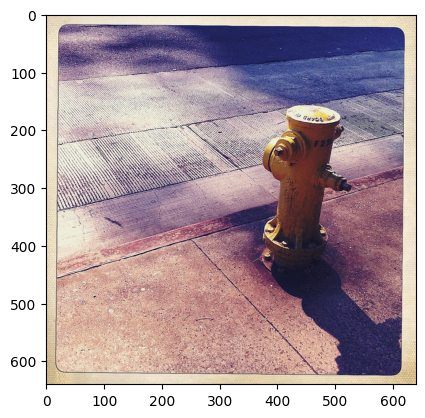

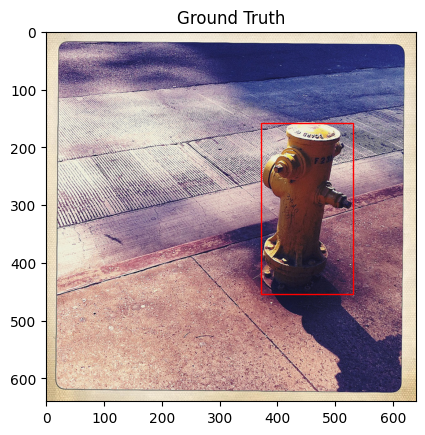

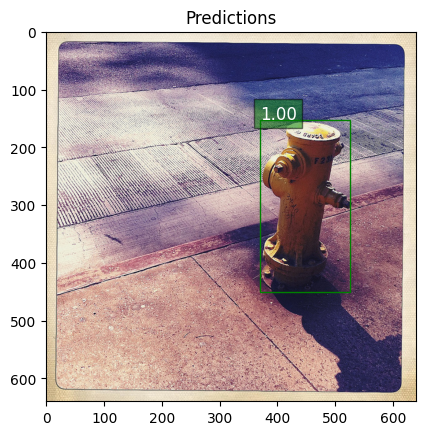

loading annotations into memory...
Done (t=33.62s)
creating index...
index created!


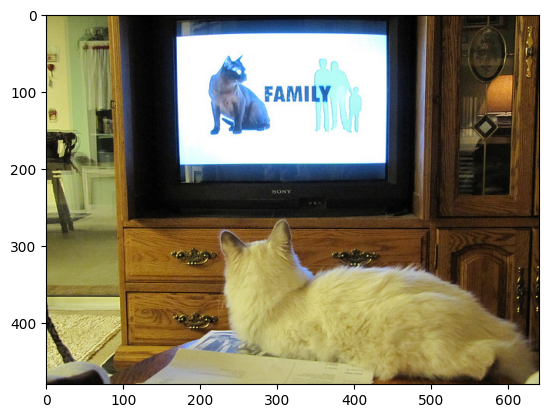

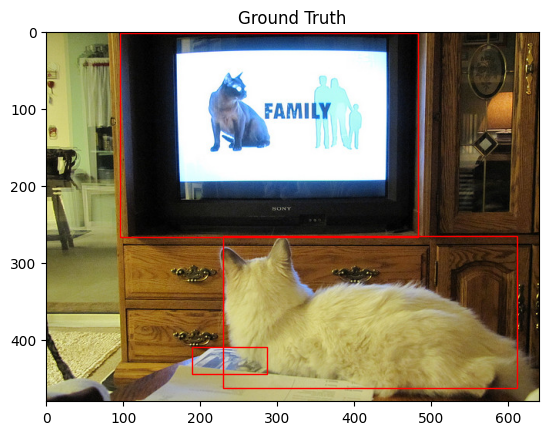

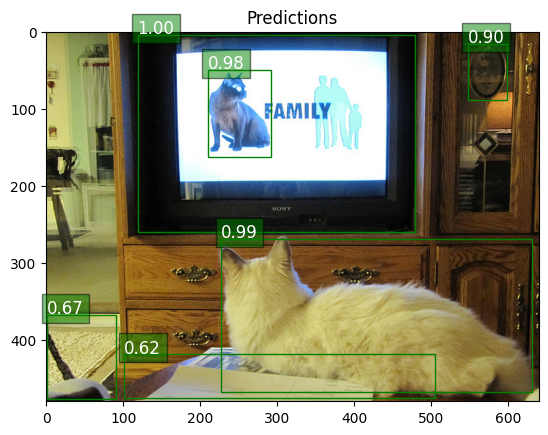

In [ ]:
# Install necessary packages
!pip install torch torchvision pycocotools scikit-image

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pycocotools.coco import COCO
import random
from skimage import io
import os

# Check if GPU is available and set the device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load pre-trained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)
model = model.to(device)
model.eval()

# Initialize COCO dataset
DATA_PATH = "/content/coco_dataset/images/train2017"
ANN_FILE = os.path.join(DATA_PATH, '/content/coco_dataset/annotations/annotations/instances_train2017.json')
coco = COCO(ANN_FILE)
img_ids = coco.getImgIds()

# Function to get a random image and its annotations
def get_rand_img(img_ids):
    img_id = random.choice(img_ids)
    img_metadata = coco.loadImgs([img_id])[0]
    img_path = os.path.join(DATA_PATH, '/content/coco_dataset/images/train2017', img_metadata['file_name'])
    img = io.imread(img_path)
    ann_ids = coco.getAnnIds(imgIds=[img_id])
    anns = coco.loadAnns(ann_ids)
    return img, anns

# Function to display ground truth bounding boxes
def display_ground_truth(image, boxes):
    fig, ax = plt.subplots()
    ax.imshow(image)
    for box in boxes:
        rect = patches.Rectangle(
            (box['bbox'][0], box['bbox'][1]),
            box['bbox'][2], box['bbox'][3],
            linewidth=1, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)
    ax.set_title("Ground Truth")
    plt.show()

# Function to display predicted bounding boxes
def display_predictions(image, outputs):
    fig, ax = plt.subplots()
    ax.imshow(image)
    bboxes = outputs[0]['boxes']
    scores = outputs[0]['scores']
    for bbox, score in zip(bboxes, scores):
        if score > 0.5:  # Display predictions with confidence score > 0.5
            rect = patches.Rectangle(
                (bbox[0], bbox[1]),
                bbox[2] - bbox[0], bbox[3] - bbox[1],
                linewidth=1, edgecolor='g', facecolor='none'
            )
            ax.add_patch(rect)
            ax.text(bbox[0], bbox[1] - 2, f"{score:.2f}", color='white', fontsize=12, bbox=dict(facecolor='green', alpha=0.5))
    ax.set_title("Predictions")
    plt.show()

# Get a random image and its annotations
img, anns = get_rand_img(img_ids)

# Display the image and its ground truth bounding boxes
plt.imshow(img)
display_ground_truth(img, anns)

# Preprocess the image and move it to the device
img_tensor = torchvision.transforms.functional.to_tensor(img).unsqueeze(0).to(device)

# Run inference
with torch.no_grad():
    outputs = model(img_tensor)

# Display the predicted bounding boxes
display_predictions(img, outputs)


##Single Shot Detector

In [ ]:
%matplotlib inline

In [ ]:
import torch
import torchvision
from torchvision.models.detection import ssd300_vgg16
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pycocotools.coco import COCO
import random
from skimage import io
import os

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SSD300_VGG16_Weights.COCO_V1`. You can also use `weights=SSD300_VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


loading annotations into memory...
Done (t=27.21s)
creating index...
index created!


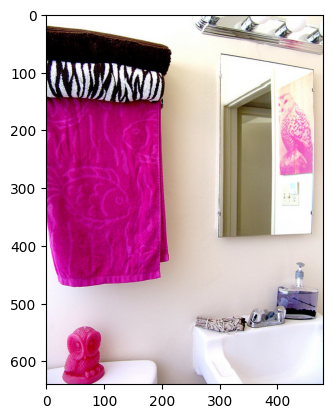

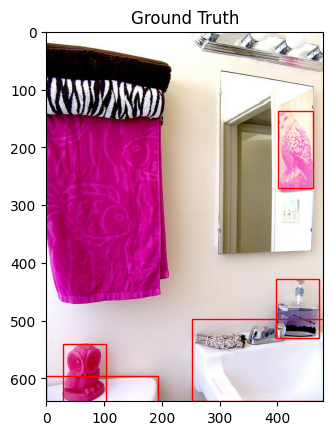

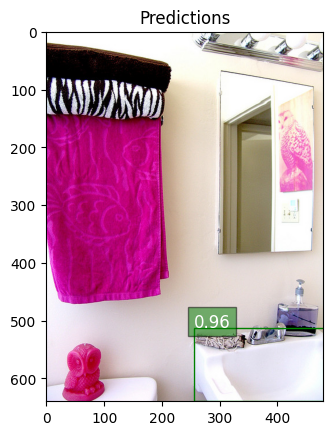

In [ ]:
# Load pre-trained SSD model
model = ssd300_vgg16(pretrained=True)
model = model.to(device)
model.eval()

# Initialize COCO dataset
DATA_PATH = "/content/coco_dataset/images/train2017"
ANN_FILE = os.path.join(DATA_PATH, '/content/coco_dataset/annotations/annotations/instances_train2017.json')
coco = COCO(ANN_FILE)
img_ids = coco.getImgIds()

# Function to get a random image and its annotations
def get_rand_img(img_ids):
    img_id = random.choice(img_ids)
    img_metadata = coco.loadImgs([img_id])[0]
    img_path = os.path.join(DATA_PATH, '/content/coco_dataset/images/train2017', img_metadata['file_name'])
    img = io.imread(img_path)
    ann_ids = coco.getAnnIds(imgIds=[img_id])
    anns = coco.loadAnns(ann_ids)
    return img, anns

# Function to display ground truth bounding boxes
def display_ground_truth(image, boxes):
    fig, ax = plt.subplots()
    ax.imshow(image)
    for box in boxes:
        rect = patches.Rectangle(
            (box['bbox'][0], box['bbox'][1]),
            box['bbox'][2], box['bbox'][3],
            linewidth=1, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)
    ax.set_title("Ground Truth")
    plt.show()

# Function to display predicted bounding boxes
def display_predictions(image, outputs):
    fig, ax = plt.subplots()
    ax.imshow(image)
    bboxes = outputs[0]['boxes']
    scores = outputs[0]['scores']
    for bbox, score in zip(bboxes, scores):
        if score > 0.5:  # Display predictions with confidence score > 0.5
            rect = patches.Rectangle(
                (bbox[0], bbox[1]),
                bbox[2] - bbox[0], bbox[3] - bbox[1],
                linewidth=1, edgecolor='g', facecolor='none'
            )
            ax.add_patch(rect)
            ax.text(bbox[0], bbox[1] - 2, f"{score:.2f}", color='white', fontsize=12, bbox=dict(facecolor='green', alpha=0.5))
    ax.set_title("Predictions")
    plt.show()

# Get a random image and its annotations
img, anns = get_rand_img(img_ids)

# Display the image and its ground truth bounding boxes
plt.imshow(img)
display_ground_truth(img, anns)

# Preprocess the image and move it to the device
img_tensor = torchvision.transforms.functional.to_tensor(img).unsqueeze(0).to(device)

# Run inference
with torch.no_grad():
    outputs = model(img_tensor)

# Display the predicted bounding boxes
display_predictions(img, outputs)

##yolov5

In [1]:
# Clone the YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
# Install dependencies
!pip install -r requirements.txt

!pip install pycocotools scikit-image


fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
  Using cached pillow-10.3.0-cp310-cp310-manylinux_2_28_x86_64.whl (4.5 MB)
  Attempting uninstall: pillow
    Found existing installation: Pillow 10.0.1
    Uninstalling Pillow-10.0.1:
      Successfully uninstalled Pillow-10.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.3.0 which is incompatible.


  Using cached Pillow-10.0.1-cp310-cp310-manylinux_2_28_x86_64.whl (3.6 MB)
ERROR: Operation cancelled by user


In [2]:
import torch
from pathlib import Path
import random
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pycocotools.coco import COCO
import numpy as np

# Load YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)
model.eval()

# Initialize COCO dataset
DATA_PATH = "/content/coco_dataset/images/train2017/"
ANN_FILE = Path("/content/coco_dataset/annotations/annotations/instances_train2017.json")
coco = COCO(ANN_FILE)
img_ids = coco.getImgIds()



Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-5-25 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


loading annotations into memory...
Done (t=25.43s)
creating index...
index created!


loading annotations into memory...
Done (t=18.05s)
creating index...
index created!


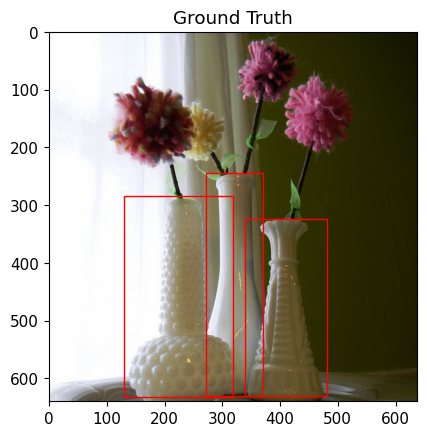

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-5-25 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


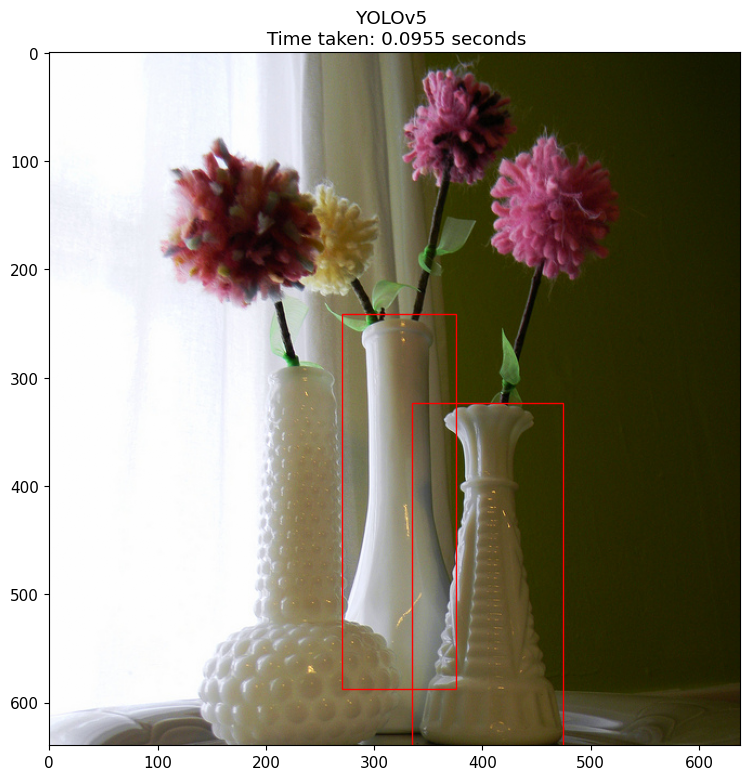

In [13]:
%matplotlib inline
from PIL import Image
import time
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import torch
import torchvision
from pycocotools.coco import COCO

# Load COCO dataset
DATA_PATH = "/content/coco_dataset/images/train2017/"
ANN_FILE = "/content/coco_dataset/annotations/annotations/instances_train2017.json"
coco = COCO(ANN_FILE)
img_ids = coco.getImgIds()

def get_rand_img(imgIds):
    img_id = random.choice(imgIds)
    img_metadata = coco.loadImgs([img_id])[0]
    img_path = DATA_PATH + img_metadata['file_name']
    img = Image.open(img_path).convert("RGB")
    annIds = coco.getAnnIds(imgIds=[img_id])
    anns = coco.loadAnns(annIds)
    return img, anns

def display_ground_truth(image, boxes):
    cpy_img = np.array(image.copy())  # Convert PIL image to numpy array
    fig, ax = plt.subplots()
    ax.imshow(cpy_img)
    for box in boxes:
        rect = patches.Rectangle(
            (int(box['bbox'][0]), int(box['bbox'][1])),
            int(box['bbox'][2]),
            int(box['bbox'][3]),
            linewidth=1,
            edgecolor='r',
            facecolor='none'
        )
        ax.add_patch(rect)
    ax.set_title("Ground Truth")
    plt.show()

def test_model(model, img):
    # Save the image to a temporary file
    img_path = '/content/temp.jpg'
    img.save(img_path)

    # Perform inference
    start_time = time.time()
    results = model(img_path)  # Use the model for inference
    end_time = time.time()

    # Convert the PIL image to a PyTorch tensor
    img_tensor = torchvision.transforms.ToTensor()(img)

    # Move the image tensor to the CPU
    img_array = img_tensor.permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C) format

    # Display the image with bounding boxes
    fig, ax = plt.subplots(1, 1, figsize=(12, 9))
    ax.imshow(img_array)  # Display the image

    # Iterate over the detected objects
    for result in results.xyxy[0]:
        if result[4] > 0.5:  # Show boxes with a confidence score above a threshold
            x_min, y_min, x_max, y_max = result[:4].cpu().numpy()
            rect = patches.Rectangle(
                (x_min, y_min),  # (x_min, y_min)
                x_max - x_min,  # width
                y_max - y_min,  # height
                linewidth=1,
                edgecolor='r',
                facecolor='none'
            )
            ax.add_patch(rect)

    inference_time = end_time - start_time
    return ax, inference_time

# Load a random image and its annotations
img, anns = get_rand_img(img_ids)

# Display the ground truth
display_ground_truth(img, anns)

# Load the YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Test the YOLOv5 model on the random image and display the results
ax, t = test_model(model, img)
ax.set_title(f"YOLOv5 \n Time taken: {round(t, 4)} seconds")
plt.show()


In [14]:
!pip install torch torchvision pycocotools matplotlib



In [15]:
%matplotlib inline


loading annotations into memory...
Done (t=20.69s)
creating index...
index created!


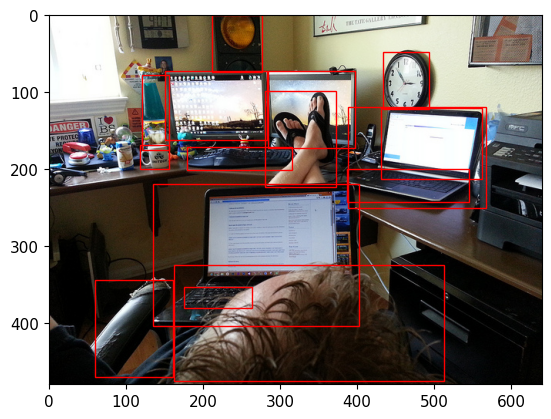

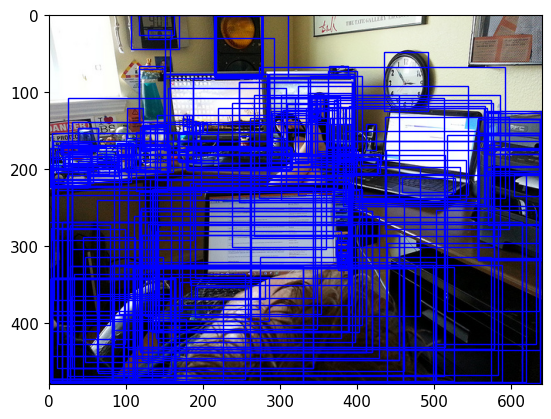

Inference Time: 0.2835 seconds


In [19]:
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.models.detection as detection
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import time
from pycocotools.coco import COCO

# Load COCO dataset
data_transform = transforms.Compose([transforms.ToTensor()])
train_dataset = torchvision.datasets.CocoDetection(root='/content/coco_dataset/images/train2017/', annFile='/content/coco_dataset/annotations/annotations/instances_train2017.json', transform=data_transform)

# Define the model
model_retinanet = detection.retinanet_resnet50_fpn(pretrained=True)
model_retinanet.eval()

# Define a function to display ground truth bounding boxes
def display_ground_truth(image, annotations):
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    for annotation in annotations:
        bbox = annotation['bbox']
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    plt.show()

# Define a function to display predicted bounding boxes
def display_predictions(image, predictions):
    fig, ax = plt.subplots(1)
    ax.imshow(image)
    for box in predictions['boxes']:
        box = box.detach().cpu().numpy()
        rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=1, edgecolor='b', facecolor='none')
        ax.add_patch(rect)
    plt.show()

# Define a function to get a random image and its annotations
def get_random_image_and_annotations(dataset):
    idx = np.random.randint(0, len(dataset))
    image, annotations = dataset[idx]
    return image, annotations

# Get a random image and its annotations
image, annotations = get_random_image_and_annotations(train_dataset)

# Display ground truth annotations
display_ground_truth(image.permute(1, 2, 0), annotations)

# Preprocess the image
image = image.unsqueeze(0)  # Add batch dimension
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
image = image.to(device)
model_retinanet.to(device)

# Run inference
start_time = time.time()
with torch.no_grad():
    predictions = model_retinanet(image)
end_time = time.time()

# Calculate inference time
inference_time = end_time - start_time

# Display predictions
display_predictions(image.squeeze(0).permute(1, 2, 0).cpu(), predictions[0])

# Display inference time
print(f"Inference Time: {inference_time:.4f} seconds")


In [20]:
!pip show yolov5

In [1]:
!pip install yolov5

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.models.detection as detection
import time
import numpy as np

# Function to calculate IoU
def calculate_iou(predictions, target):
    # Ensure predictions and target have at least one bounding box
    if len(predictions['boxes']) == 0 or len(target) == 0:
        return 0.0

    pred_bbox = predictions['boxes'][0].detach().cpu().numpy()
    target_bbox = target[0]['bbox']

    # Calculate the intersection area
    x_min = max(pred_bbox[0], target_bbox[0])
    y_min = max(pred_bbox[1], target_bbox[1])
    x_max = min(pred_bbox[2], target_bbox[0] + target_bbox[2])
    y_max = min(pred_bbox[3], target_bbox[1] + target_bbox[3])

    intersection_area = max(0, x_max - x_min) * max(0, y_max - y_min)

    # Calculate the union area
    pred_area = (pred_bbox[2] - pred_bbox[0]) * (pred_bbox[3] - pred_bbox[1])
    target_area = target_bbox[2] * target_bbox[3]
    union_area = pred_area + target_area - intersection_area

    # Calculate IoU
    if union_area == 0:
        return 0.0

    iou = intersection_area / union_area
    return iou

# Function to calculate mAP (dummy implementation for illustration)
def calculate_mAP(model, dataset):
    # Implement mAP calculation here (code omitted for brevity)
    return 0.0

# Load the test dataset
test_transform = transforms.Compose([transforms.ToTensor()])
test_dataset = torchvision.datasets.CocoDetection(root='/content/coco_dataset/images/train2017/', annFile='/content/coco_dataset/annotations/annotations/instances_train2017.json', transform=test_transform)

# Define the models
models = {
    "Faster R-CNN": detection.fasterrcnn_resnet50_fpn(pretrained=True),
    "SSD": detection.ssd300_vgg16(pretrained=True),
    "RetinaNet": detection.retinanet_resnet50_fpn(pretrained=True)
}

# Load YOLOv5 model
model_yolov5 = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Evaluate each model
for model_name, model in models.items():
    print(f"Evaluating {model_name}...")
    model.to(device).eval()

    # Run inference and measure inference time
    start_time = time.time()
    total_iou = 0.0
    total_images = 0
    batch_size = 4  # Adjust batch size as needed

    for i in range(0, len(test_dataset), batch_size):
        images, targets = zip(*[test_dataset[j] for j in range(i, min(i + batch_size, len(test_dataset)))])
        images = [image.to(device) for image in images]

        with torch.no_grad():
            predictions = model(images)

        for pred, target in zip(predictions, targets):
            iou = calculate_iou(pred, target)
            total_iou += iou
            total_images += 1

    end_time = time.time()
    inference_time = end_time - start_time

    # Compute mAP
    mAP = calculate_mAP(model, test_dataset)

    # Display results
    print(f"{model_name}:")
    print(f"Mean IoU: {total_iou / total_images}")
    print(f"mAP: {mAP}")
    print(f"Inference time: {inference_time} seconds")
    print("")

# Evaluate YOLOv5
print("Evaluating YOLOv5...")
model_yolov5.to(device).eval()
start_time = time.time()
total_iou = 0.0
total_images = 0

for i in range(0, len(test_dataset), batch_size):
    images, targets = zip(*[test_dataset[j] for j in range(i, min(i + batch_size, len(test_dataset)))])
    images = [image.to(device) for image in images]

    with torch.no_grad():
        predictions = model_yolov5(images)

    for pred, target in zip(predictions, targets):
        iou = calculate_iou(pred, target)
        total_iou += iou
        total_images += 1

end_time = time.time()
inference_time = end_time - start_time

# Display results for YOLOv5
print("YOLOv5:")
print(f"Mean IoU: {total_iou / total_images}")
print(f"Inference time: {inference_time} seconds")


loading annotations into memory...
Done (t=17.08s)
creating index...
index created!


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-5-25 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


Evaluating Faster R-CNN...
